In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline, make_union, make_pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler, RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, calinski_harabasz_score
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold, RepeatedStratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.dummy import DummyClassifier
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import plotly
import plotly.express as px
import chart_studio
import chart_studio.plotly as py

In [2]:
#Importamos los datos y dropeamos la columna 0 para convertirla en el indice)
data_location = 'Data Spotify.csv'
data = pd.read_csv(data_location)
data.drop(columns="Unnamed: 0",inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131945 entries, 0 to 131944
Data columns (total 24 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Artista           131945 non-null  object 
 1   pista             131945 non-null  object 
 2   album             131945 non-null  object 
 3   danceability      131945 non-null  float64
 4   energy            131945 non-null  float64
 5   key               131945 non-null  float64
 6   loudness          131945 non-null  float64
 7   mode              131945 non-null  float64
 8   speechiness       131945 non-null  float64
 9   acousticness      131945 non-null  float64
 10  instrumentalness  131945 non-null  float64
 11  liveness          131945 non-null  float64
 12  valence           131945 non-null  float64
 13  tempo             131945 non-null  float64
 14  type              131945 non-null  object 
 15  id                131945 non-null  object 
 16  uri               13

In [3]:
data.drop(columns=['type','id','track_href','analysis_url'],inplace=True)

In [5]:
dummies = ['key','time_signature','mode','decada']
numerical = [x for x in list(data.dtypes.index) if x not in dummies and data.dtypes.loc[x] != 'object']

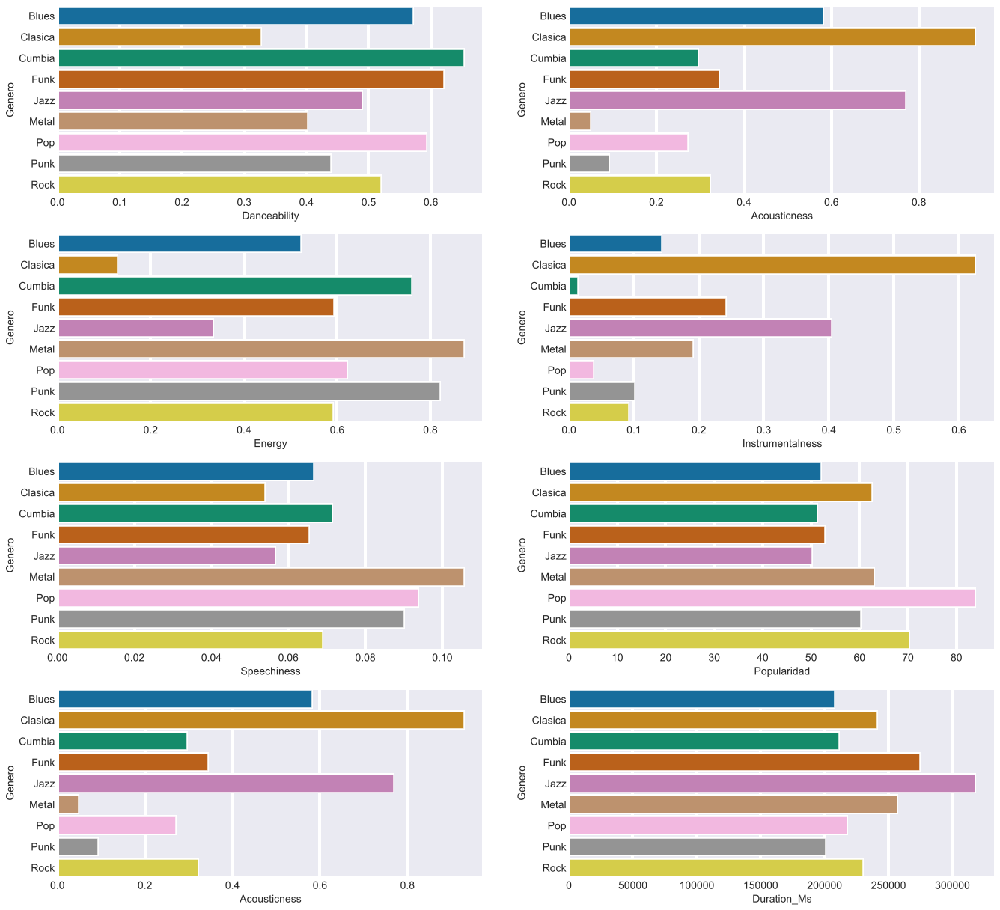

In [6]:
plt.xkcd(scale=0)
df = data.groupby('Genero')[numerical].mean()
plt.style.use('fivethirtyeight')
sns.set_style('darkgrid')
sns.set_palette('colorblind')
fig, ax= plt.subplots(4,2,figsize=(20,20))
columnas = ['danceability', 'energy', 'speechiness', 'acousticness',
            'instrumentalness','popularidad', 'duration_ms', 'valence']

for i in range(int(len(columnas)/2)):
        sns.barplot(data= df, y=df.index, x=columnas[i],ax=ax[i,0],orient='h')
        ax[i,0].set_ylabel("Genero",fontdict={"fontsize":14})
        ax[i,0].set_xlabel(columnas[i].title(),fontdict={"fontsize":14})

for i in range(int(len(columnas)/2)):
        sns.barplot(data= df, y=df.index, x=columnas[i+3],ax=ax[i,1],orient='h')
        ax[i,1].set_ylabel("Genero",fontdict={"fontsize":14})
        ax[i,1].set_xlabel(columnas[i+3].title(),fontdict={"fontsize":14})

#### Balanceo

In [7]:
balance_antes = data.Genero.value_counts(normalize=True).round(2)
#Balanceo:
generos = data.Genero.value_counts(normalize=True).round(2)
generos = list(generos[generos > balance_antes.min()].index)

dic = {'solo_Pop':data.loc[data["Genero"] == "Pop"]}
for genero in generos:
    dic['solo_' + genero] = data.loc[data['Genero']== genero].sample(len(dic['solo_Pop']))
    
data = pd.concat(dic, ignore_index=True)
#print(data.Genero.value_counts(normalize=True).round(2))
display(pd.DataFrame({'Antes':balance_antes,'Después':data.Genero.value_counts(normalize=True).round(2)}))
print('\nShape:',data.shape)

,Antes,Después
Blues,0.10,0.11
Clasica,0.20,0.11
Cumbia,0.10,0.11
Funk,0.12,0.11
Jazz,0.10,0.11
Metal,0.10,0.11
Pop,0.08,0.11
Punk,0.09,0.11
Rock,0.11,0.11



Shape: (90963, 20)


In [8]:
plt.rcdefaults()

#### Pipeline

In [9]:
numeric_transformer = Pipeline(steps=[('scaler', StandardScaler())])
categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))])

engineer = ColumnTransformer(transformers=[('num', numeric_transformer, numerical),
                                           ('cat', categorical_transformer, dummies)])

folds=StratifiedKFold(n_splits=5,shuffle=True, random_state=42)


In [10]:
def accuracy(y_test, y_pred):
    print('Accuracy Score:',accuracy_score(y_test,y_pred).round(2))
    print("F1 Score:", f1_score(y_test,y_pred, average="weighted").round(2))
    
    fig, ax = plt.subplots(figsize=(20,10))
    sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt='.0f')
    plt.xticks(ticks= np.array(range(len(data.Genero.unique())))+0.5,labels=data.Genero.unique())
    plt.yticks(ticks= np.array(range(len(data.Genero.unique())))+0.5,labels=data.Genero.unique())
    plt.ylabel('Verdaderos', fontdict={"fontsize":14})
    plt.xlabel('Predichos',fontdict={"fontsize":14})
    

#### PCA

In [84]:
pipeline_pca = Pipeline(steps=[('feature_engineering', engineer),
                      ('pca', PCA(n_components=3))])
df_pca = pd.DataFrame(pipeline_pca.fit_transform(data), columns=['PC1', 'PC2','PC3'])
df_pca['Genero'] = data['Genero']
df_pca['Artista'] = data.Artista


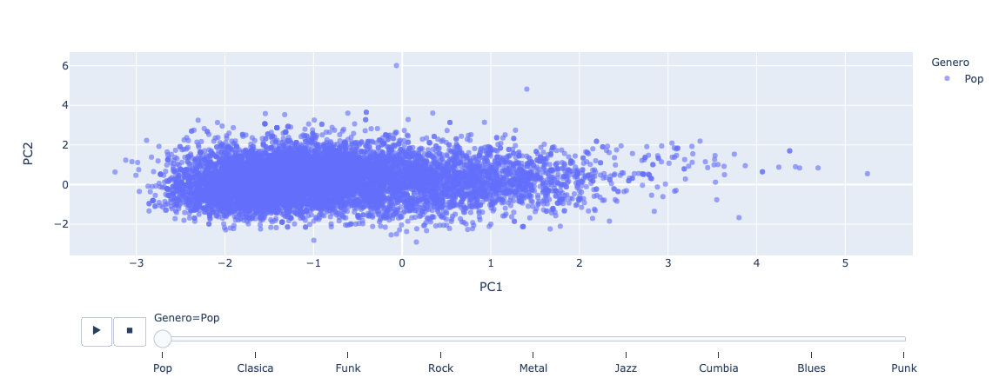

In [85]:
px.scatter(data_frame=df_pca, x = df_pca.PC1, y = df_pca.PC2, color=df_pca.Genero,
           opacity = 0.6,animation_frame=df_pca.Genero,hover_name=df_pca.Artista,
           labels={"x":"PC1","y":"PC2"})

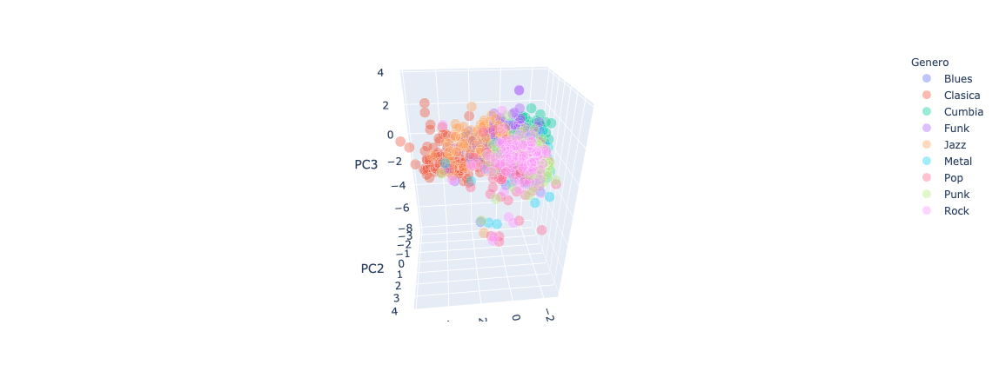

In [86]:
df_pca = df_pca.groupby('Genero', group_keys=False).apply(lambda x: x.sample(100)) #Sampleo para no llenar el gráfico
x_coord = df_pca.PC1
y_coord = df_pca.PC2
z_coord = df_pca.PC3

marks_size = [2 for i in range(len(x_coord))]

fig = px.scatter_3d(data_frame=df_pca, x = x_coord, y = y_coord, z = z_coord, color=df_pca.Genero,
              opacity = 0.4, size = marks_size,hover_name=df_pca.Artista,labels={"x":"PC1","y":"PC2","z":"PC3"})

fig.show()


#### Train - Test

In [11]:
X = data[['danceability', 'energy', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo','duration_ms','key','time_signature','decada','popularidad']]
y = data['Genero']

X_train, X_test, y_train, y_test = train_test_split(X,y)


#### Baseline 1: Dummy Classifier

Accuracy Score: 0.12
F1 Score: 0.12


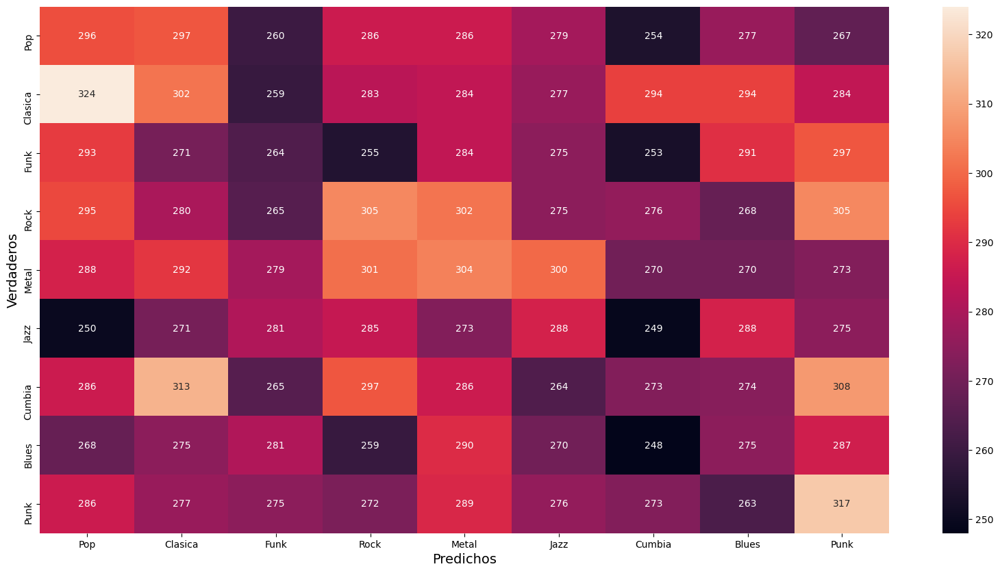

In [88]:
pipeline_dummy = Pipeline(steps=[('feature_engineering', engineer),
                      ('dummy', DummyClassifier(strategy="uniform"))])

pipeline_dummy.fit(X_train,y_train)
y_pred = pipeline_dummy.predict(X_test)
accuracy(y_test,y_pred)


#### Baseline 2: GaussianNB

Accuracy Score: 0.37
F1 Score: 0.3


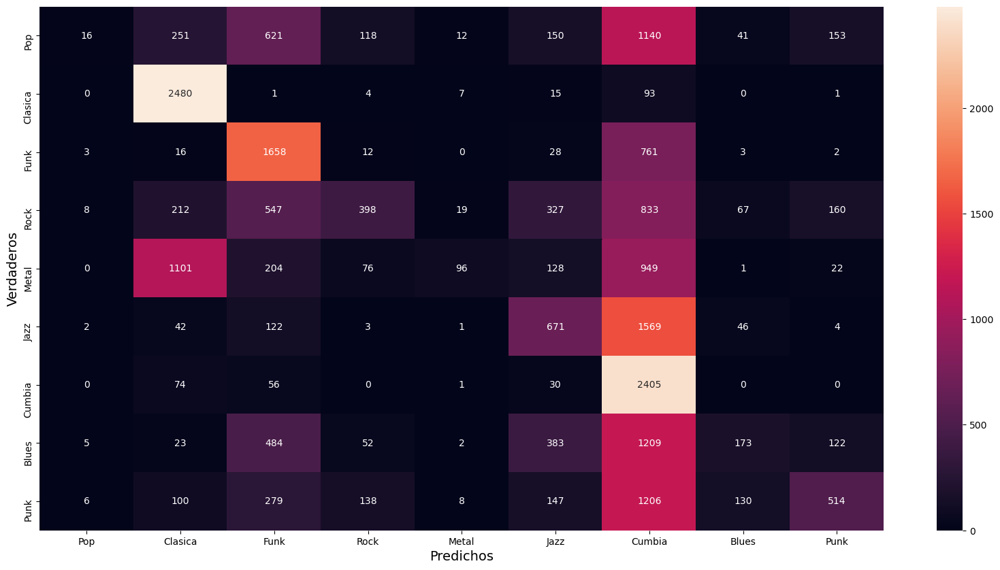

In [89]:
pipeline_gnb = Pipeline(steps=[('feature_engineering', engineer),
                      ('gauss', GaussianNB())])

pipeline_gnb.fit(X_train,y_train)
y_pred = pipeline_gnb.predict(X_test)
accuracy(y_test,y_pred)


#### Logistic Regression

<img src="Screen Randomized logreg.png" alt="Drawing" style="width: 1000px;"/>

Accuracy Score: 0.64
F1 Score: 0.63


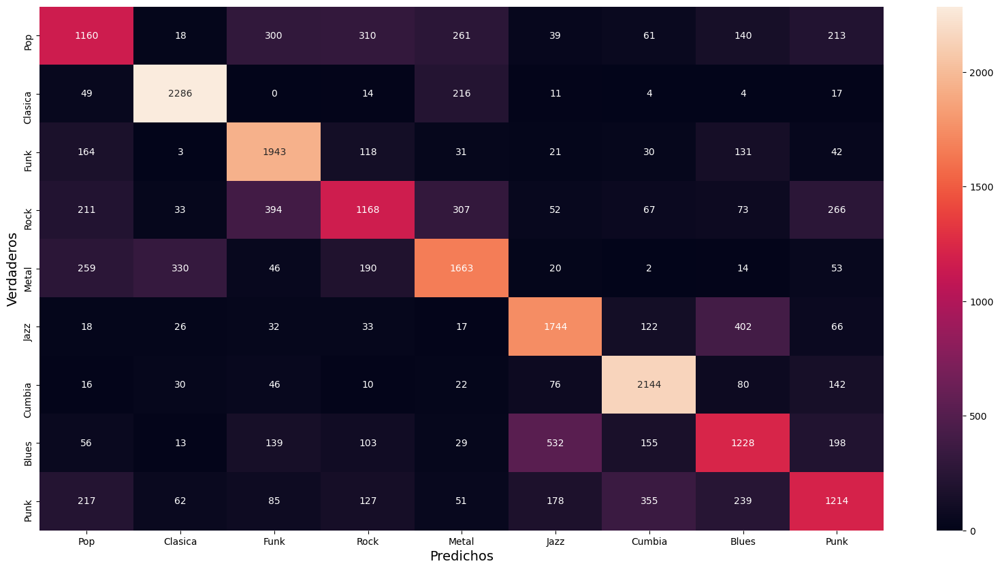

In [90]:
pipeline_log = Pipeline(steps=[('feature_engineering', engineer),
                      ('gauss', LogisticRegression(C=57676, max_iter=6000))])

pipeline_log.fit(X_train,y_train)
y_pred = pipeline_log.predict(X_test)
accuracy(y_test,y_pred)

#### KNN

Accuracy Score: 0.67
F1 Score: 0.66


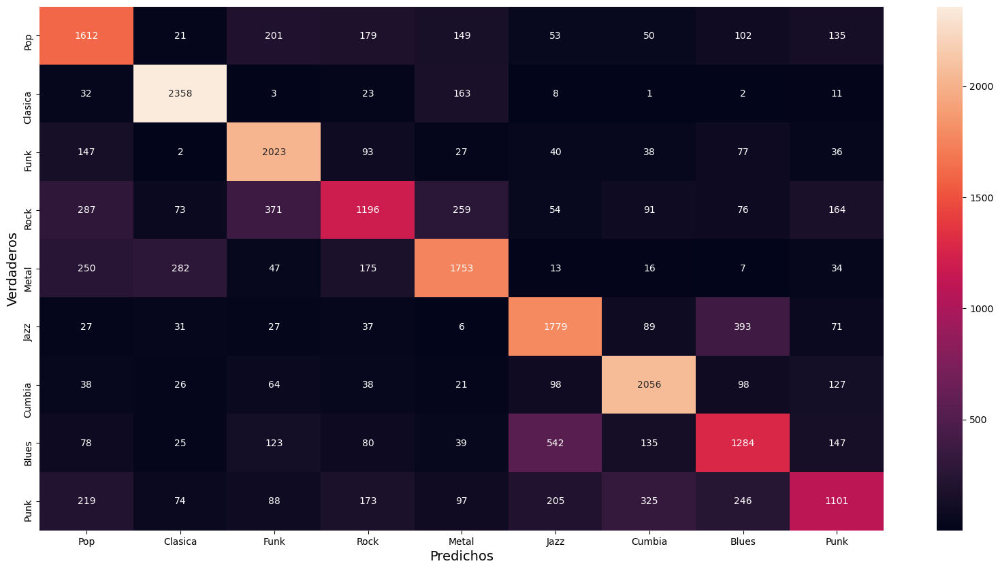

In [114]:
pipeline_knn = Pipeline(steps=[('feature_engineering', engineer),
                               ('knn', KNeighborsClassifier())])

pipeline_knn.fit(X_train,y_train)
y_pred = pipeline_knn.predict(X_test)
accuracy(y_test,y_pred)

<img src="Captura de Pantalla 2020-11-29 a la(s) 19.57.26.png" alt="Drawing" style="width: 1000px;"/>

#### Comparación de otros scalers

In [108]:
pipeline_knn = Pipeline(steps=[('feature_engineering', engineer),
                               ('knn', KNeighborsClassifier(n_neighbors=16,weights='distance'))])

param_grid = {'feature_engineering__num':[StandardScaler(), MinMaxScaler(), RobustScaler()]}

grid = GridSearchCV(pipeline_scaler, param_grid, cv=folds)

grid.fit(X_train,y_train)


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('feature_engineering',
                                        ColumnTransformer(transformers=[('num',
                                                                         MinMaxScaler(),
                                                                         ['danceability',
                                                                          'energy',
                                                                          'loudness',
                                                                          'speechiness',
                                                                          'acousticness',
                                                                          'instrumentalness',
                                                                          'liveness',
                                                                         

In [111]:
print(grid.best_score_)
print(grid.best_params_)

0.7038491832139655
{'feature_engineering__num': StandardScaler()}


#### Modelo Elegido

In [ ]:
pipeline_knn = Pipeline(steps=[('feature_engineering', engineer),
                               ('knn', KNeighborsClassifier(n_neighbors=16,weights='distance'))])

pipeline_knn.fit(X_train,y_train)
y_pred = pipeline_knn.predict(X_test)
accuracy(y_test,y_pred)

In [1]:
#display(data.describe())
dic = {}
caract = ['loudness', 'tempo','instrumentalness', 'duration_ms','acousticness','energy', 'danceability','valence', 'speechiness']
for genero in X_.Genero.unique():
    df = data[data.Genero == genero][caract]
    
    for variable in caract:
        q1 = df[variable].quantile(0.25)
        q3 = df[variable].quantile(0.75)

        thresh_up = q3 + 1.5*(q3-q1)
        thresh_down = q1 - 1.5*(q3-q1)

        desp_filtro = df[variable][(df[variable] <= thresh_up) & (df[variable] >= thresh_down)].index
        
        df = df.loc[desp_filtro]
    dic[genero] = df


df = pd.concat(dic.values())
df_2 = data[[x for x in data.columns if x not in caract]].loc[df.index]
data = df.join(df_2)

#### Prueba de Playlist

In [116]:
import spotipy
import spotipy.util as util
from spotipy.oauth2 import SpotifyClientCredentials

In [117]:
cid = ''
secret = ''
username = ""

client_credentials_manager = SpotifyClientCredentials(client_id=cid, client_secret=secret) 
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)


In [178]:
playlist_uri = ""
track_list = {}
for item in sp.playlist_items(playlist_uri)['items']:
    fecha = item['track']['album']['release_date']
    uri_artista = item['track']['artists'][0]['uri']
    pop = sp.artist(uri_artista)['popularity']

    track_list[item['track']["name"]] = {'uri':item['track']["uri"],'Pista':item['track']['name'],'Album':item['track']['album']['name'],
                                         'decada':(int(fecha.split('-')[0][2:])//10) * 10,'popularidad':pop}
    
    features = sp.audio_features(item['track']['uri'])[0]
    
    track_list[item['track']["name"]].update(features)
    
df_test = pd.DataFrame(track_list).transpose()

pred = pipeline_knn.predict(df_test[X_test.columns])
df_test['Genero'] = pred
df_test[['Album','Genero']]

,Album,Genero
Time,The Dark Side of the Moon,Rock
Dogs,Animals,Rock
Pigs (Three Different Ones),Animals,Jazz
Shine On You Crazy Diamond (Pts. 1-5),Wish You Were Here,Rock
Fuerza Natural,Fuerza Natural,Metal
Deja Vu,Fuerza Natural,Rock
Ojo De La Tormenta - Remasterizado 2007,Sueño Stereo (Remastered),Rock
Lago en el Cielo,Ahí Vamos,Punk
En la Ciudad de la Furia (SEP7IMO DIA),SEP7IMO DIA,Metal
Carry Me Away,Carry Me Away,Blues
